# Texture Synthesis with CNNs in PyTorch

<a href="https://colab.research.google.com/github/trsvchn/deep-textures/blob/main/example.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#### import 부분

In [1]:
import torch
import torch.optim as optim
from torchvision.transforms.functional import normalize

from PIL import Image as img
import matplotlib.pyplot as plt

from deeptextures import vgg19, gram_loss, gram_loss_rotate
from deeptextures.utils import set_seed, set_device, prep_img, to_pil, MEAN, STD

from io import BytesIO
from urllib.request import urlopen

import numpy as np

import os, sys

#### 디바이스 gpu 연결

In [2]:
# gpu 연결 확인

print("current device : {}, device 0 : {} , is available : {} , torch version : {}"
      .format(torch.cuda.current_device(), torch.cuda.get_device_name(0) , torch.cuda.is_available() , torch.__version__))

current device : 0, device 0 : NVIDIA GeForce RTX 3060 Laptop GPU , is available : True , torch version : 2.0.1


In [3]:
# Uncomment if running from Colab
# !git clone https://github.com/trsvchn/deep-textures.git
# %cd deep-textures

Unofficial Reimplementation of **"Texture Synthesis Using Convolutional Neural Networks"** in PyTorch
(Gatys et al. 2015) (http://arxiv.org/abs/1505.07376)

## Prepare Data

In [4]:
# Get the example image from the official repo
#IMG = "https://raw.githubusercontent.com/leongatys/DeepTextures/master/Images/pebbles.jpg" # url 경우
IMG = "E:/Project_Ch00cy/CGVR/TextureSynthesis/deep-textures-main/testingTextures/000.jpg" # jpg 일 경우
# IMG = "E:/Project_Ch00cy/TextureSynthesis/deep-textures-main/testingTextures/txt09.png" # png 일 경우

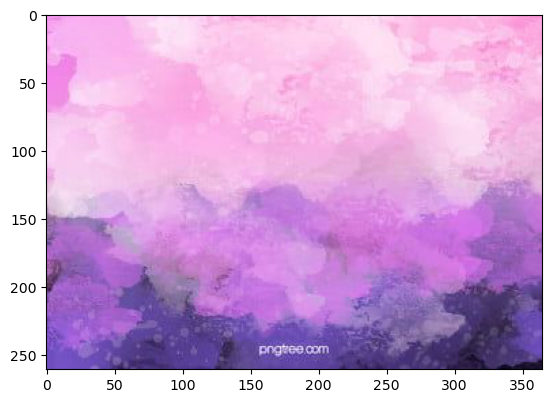

In [5]:
# Take a look
#texture = Image.open(BytesIO(urlopen(IMG).read()))
texture = img.open(IMG) # 이미지 파일 메타 정보 확인 -> 이미지 객체 반환
texture = texture.convert('RGB')

plt.imshow(texture)  # imshow는 원하는 사이즈의 픽셀을 원하는 색으로 채워서 만든 그림 , colormap 설정가능

In [6]:
# Save it (uncomment to save) - 확인용
texture.save("inputTexture.jpg")

# Add Rotation

#### 회전 예제 이미지 생성하는 부분 - 외부 python 코드 실행

In [7]:
# 실험 텍스처 바뀔 때 -> 8개의 새 텍스처 생성 해줄것인가?(True) / 이미 생성된 8개 텍스처 사용할 것인가?(False)
NEW_GENERATE = True

In [8]:
if NEW_GENERATE:
    print("새 회전 텍스처 생성 시작")
    os.chdir('./generatetextures')
    os.getcwd()

    !python main.py --image_path $IMG

    os.chdir('../')
    os.getcwd()
    
    print("새 회전 텍스처 생성 완료")
else:
    print("기존 회전 텍스처 사용 예정")

새 회전 텍스처 생성 시작
^C
새 회전 텍스처 생성 완료


#### 기본적인 설정과 전처리

In [ ]:
n_iters = 1200  # 학습 반복할 정도
layers = ["conv1_1", "pool1", "pool2", "pool3", "pool4"]
layers_weigths = [1e9] * len(layers)    # 0.000000001 * 레이어 개수(5)
log_every = 200 # 몇번째마다 기록 print
seed = np.random.randint(0,50)  # 고정 안해놔야 항상 결과 바뀜
print(seed)


# Set device and a seed
device = set_device()
# set_seed(seed)

# Init model
model = vgg19().to(device)  # 레이어만 생성

10


#### 생성된 회전 예제 이미지 -> 우리 코드 target 리스트로 가져오기

In [ ]:
target = []
imax = 8
# Prepare texture data
for i in range(imax):
    image = "./generatetextures/new_forcnn8"+str(i+1)+".png"
    target.append(prep_img(image).to(device))
print(target[0].shape)

torch.Size([1, 3, 326, 326])


#### 갱신할 새 노이즈 이미지

In [ ]:
# Init input image
synth = torch.randint_like(target[0], 0, 256)
synth = synth.div(255)
synth = normalize(synth, MEAN, STD)
synth.requires_grad_(True)

tensor([[[[ 1.1015, -0.5938,  0.1768,  ..., -1.7754, -0.6965,  2.1290],
          [ 1.6153,  1.3584,  2.1290,  ...,  1.9407, -1.3815,  1.1358],
          [-1.6384,  1.6495,  1.4098,  ...,  0.8789,  1.4269,  1.2214],
          ...,
          [ 0.5536,  1.9578, -1.9467,  ...,  0.0569,  0.8618,  2.0948],
          [ 0.8961,  1.8893,  0.4851,  ...,  0.4508,  0.0569,  0.6392],
          [ 1.5125,  0.8789,  0.2967,  ..., -0.0972,  0.3652, -0.1999]],

         [[ 2.2535, -0.6176, -1.0378,  ..., -0.3200, -0.7052, -0.9153],
          [-1.5980, -1.3354,  1.3081,  ..., -1.1429,  0.3803,  0.2577],
          [-1.3354, -0.1099, -1.0028,  ..., -1.4580, -0.0224, -1.5280],
          ...,
          [-1.3354,  0.5203, -2.0357,  ...,  2.2710,  2.0609, -0.7577],
          [-1.4580,  0.1352, -0.3901,  ...,  1.7633, -0.1450,  1.4832],
          [-0.8102,  0.7304,  1.5707,  ...,  0.4328, -0.1099,  0.9755]],

         [[-0.7587,  1.1934, -0.9156,  ..., -1.0027, -1.3513,  2.2566],
          [ 0.4962, -1.6127,  

#### Train 학습 부분

0 88350326784.0


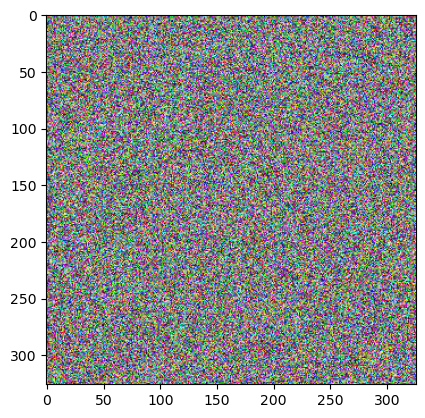

200 6046718464.0


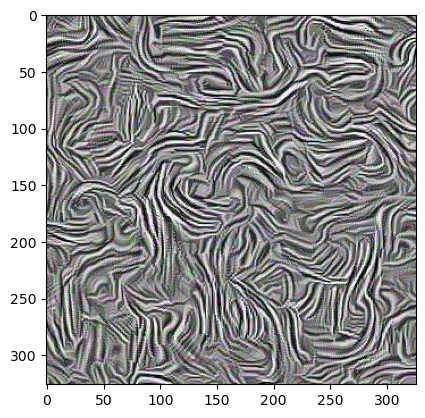

400 6045140480.0


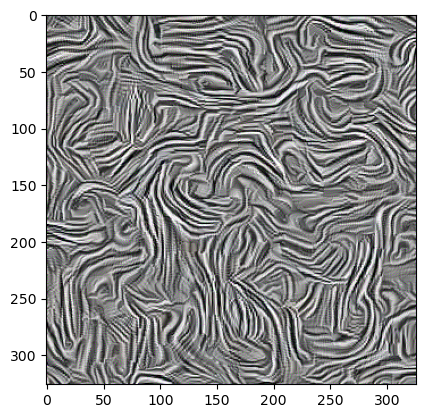

600 6045046272.0


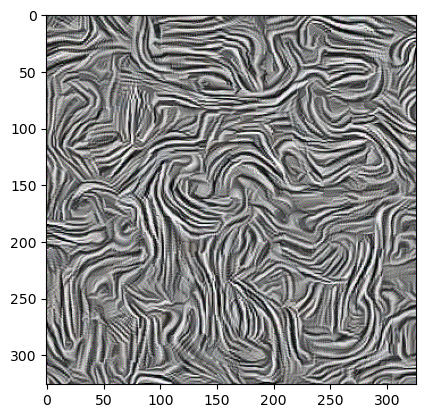

800 6045046272.0


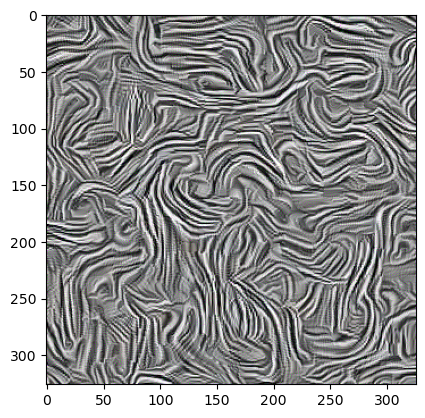

1000 6045046784.0


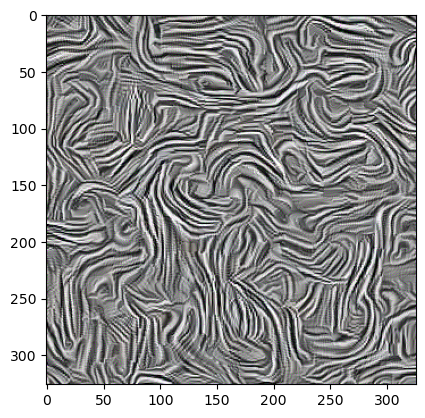

1200 6045046272.0


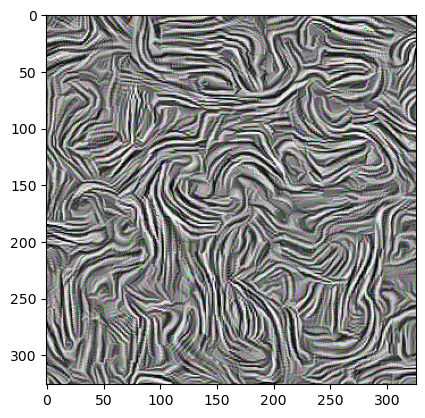

1400 6045046272.0


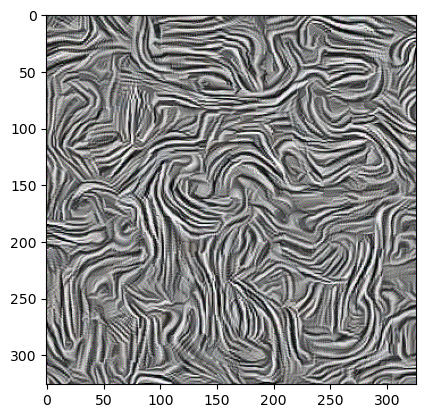

1600 6045046272.0


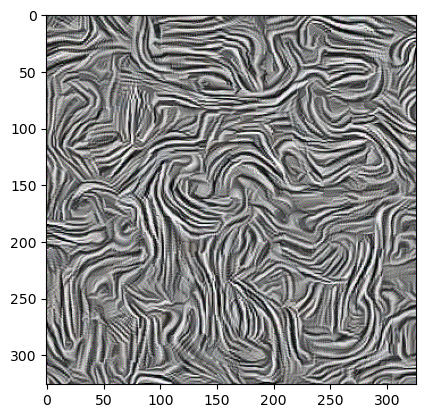

1800 6045046272.0


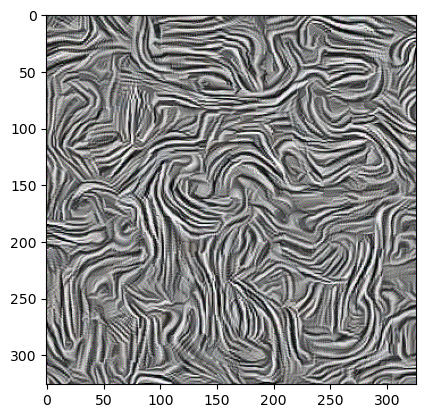

2000 6045046272.0


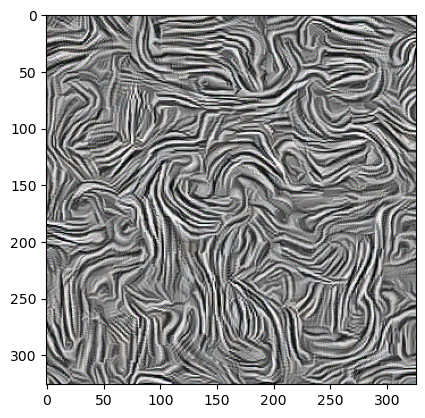

In [ ]:
# Set optimizer
optimizer = optim.LBFGS(
    [synth],
    tolerance_grad=0.0,
    tolerance_change=0.0,
    line_search_fn="strong_wolfe",
)

# scheduler = optim.lr_scheduler.LambdaLR(optimizer=optimizer, lr_lambda=lambda epoch: 0.65 ** epoch)

# Get feature maps for the target texture
target_activations = []
for rTarget in target:
    target_activations.append([*model(rTarget, layers)])

iter_ = 0
while iter_ <= n_iters:

    def closure():
        global iter_

        optimizer.zero_grad()

        synth_activations = [*model(synth, layers)]

        assert len(synth_activations) == len(target_activations[0]) == len(layers_weigths)

        total_loss = 0
        
        # Compute loss for each activation
        for target_activation in target_activations:
            losses = []
            for activations in zip(synth_activations, target_activation, layers_weigths):
                losses.append(gram_loss(*activations).unsqueeze(0))
                # losses.append(gram_loss_rotate(*activations).unsqueeze(0))
                total_loss += torch.cat(losses).sum()

    
        total_loss.backward()

        if iter_ == 0 or iter_ % log_every == 0:
            # Print loss value
            print(iter_, total_loss.item())

            # Show image
            plt.imshow(to_pil(synth.squeeze(0)))
            plt.show()

        iter_ += 1

        return total_loss

    optimizer.step(closure)
# scheduler.step()


# Save generated texture
to_pil(synth.squeeze()).save("rotate_outputTexture.png")


## Using LBFGS

In [9]:
image = IMG
if texture.size[0]>=texture.size[1]:
    img_size = texture.size[1]
else:
    img_size = texture.size[0]
if img_size%2!=0:
    img_size = img_size-1
# img_size = 256

n_iters = 1000
layers = ["conv1_1", "pool1", "pool2", "pool3", "pool4"]
layers_weigths = [1e9] * len(layers)
log_every = 200
seed = 0


# Set device and a seed
device = set_device()
set_seed(seed)

# Init model
model = vgg19().to(device)  # 레이어만 생성

model

VGG19(
  (conv1_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv1_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool1): AvgPool2d(kernel_size=2, stride=2, padding=0)
  (conv2_1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2_2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool2): AvgPool2d(kernel_size=2, stride=2, padding=0)
  (conv3_1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3_2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3_3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3_4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool3): AvgPool2d(kernel_size=2, stride=2, padding=0)
  (conv4_1): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4_2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4_3): Conv2

In [10]:
# Prepare texture data
target = prep_img(image).to(device)

# Init input image
synth = torch.randint_like(target, 0, 256)
synth = synth.div(255)
synth = normalize(synth, MEAN, STD)
synth.requires_grad_(True)

print(target.shape)
print(synth.shape)

torch.Size([1, 3, 261, 365])
torch.Size([1, 3, 261, 365])


In [11]:
# Set optimizer
optimizer = optim.LBFGS(
    [synth],
    tolerance_grad=0.0,
    tolerance_change=0.0,
    line_search_fn="strong_wolfe",
)

# Get feature maps for the target texture
target_activations = [*model(target, layers)]

target_activations


[tensor([[[[2.2772e-01, 6.3983e-01, 6.4897e-01,  ..., 5.1110e-01,
            5.0789e-01, 2.6762e-01],
           [1.2469e-02, 2.0636e-01, 1.8720e-01,  ..., 3.8996e-02,
            4.6188e-02, 3.9458e-03],
           [4.8704e-02, 2.3936e-01, 1.8148e-01,  ..., 1.0691e-01,
            1.4054e-01, 8.8553e-02],
           ...,
           [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
            0.0000e+00, 0.0000e+00],
           [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
            0.0000e+00, 0.0000e+00],
           [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
            0.0000e+00, 0.0000e+00]],
 
          [[0.0000e+00, 1.8974e+00, 1.8241e+00,  ..., 1.9493e+00,
            1.9509e+00, 4.0290e+00],
           [0.0000e+00, 5.6110e-01, 3.8409e-01,  ..., 2.9061e-01,
            3.2573e-01, 3.8755e+00],
           [0.0000e+00, 3.9596e-01, 2.7480e-01,  ..., 4.6555e-01,
            5.4582e-01, 4.1380e+00],
           ...,
           [1.1344e+00, 3.3295e-01, 3.

0 5086130176.0
Step: 0 / total Loss: 5086130176.0 / 


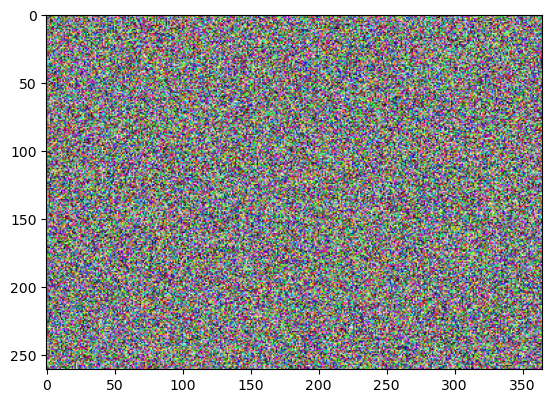

200 458490.03125
Step: 200 / total Loss: 458490.03125 / 


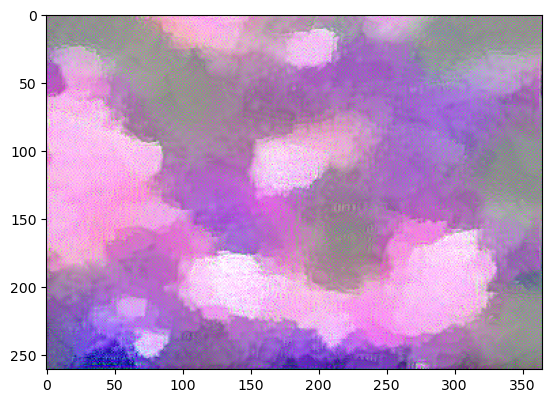

400 73879.109375
Step: 400 / total Loss: 73879.109375 / 


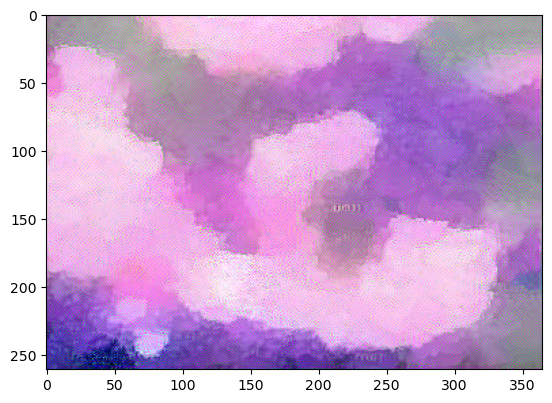

600 23171.8359375
Step: 600 / total Loss: 23171.8359375 / 


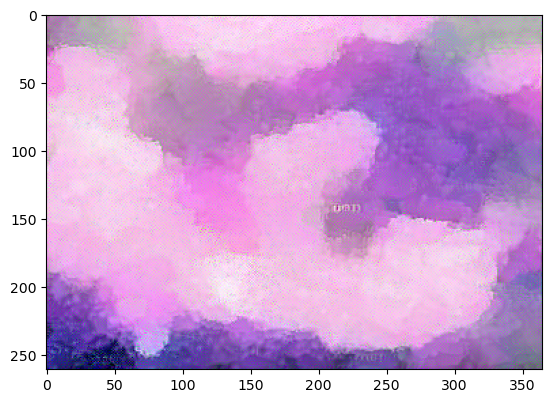

800 12975.966796875
Step: 800 / total Loss: 12975.966796875 / 


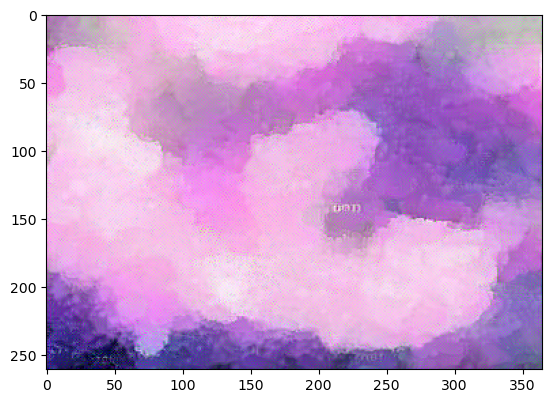

1000 9236.380859375
Step: 1000 / total Loss: 9236.380859375 / 


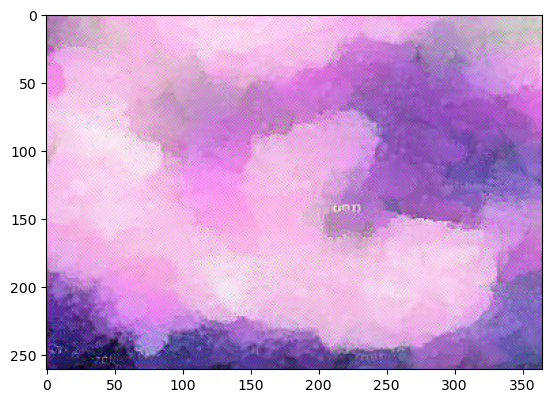

In [12]:
iter_ = 0
while iter_ <= n_iters:

    def closure():
        global iter_

        optimizer.zero_grad()

        synth_activations = [*model(synth, layers)]

        assert len(synth_activations) == len(target_activations) == len(layers_weigths)
        
        # Compute loss for each activation
        losses = []
        for activations in zip(synth_activations, target_activations, layers_weigths):
            losses.append(gram_loss(*activations).unsqueeze(0))

        total_loss = torch.cat(losses).sum()
        total_loss.backward()

        if iter_ == 0 or iter_ % log_every == 0:
            # Print loss value
            print(iter_, total_loss.item())
            print(f'Step: {iter_} / total Loss: {total_loss} / ')

            # Show image
            plt.imshow(to_pil(synth.squeeze(0)))
            plt.show()

        iter_ += 1

        return total_loss

    optimizer.step(closure)


# Save generated texture
to_pil(synth.squeeze()).save("LBFGS_outputTexture.png")

## Using Adam

In [ ]:
image = "pebbles.jpg"
img_size = 256
n_iters = 1000
layers = ["conv1_1", "pool1", "pool2", "pool3", "pool4"]
layers_weigths = [1e9] * len(layers)
log_every = 500
seed = 0 

# Set device and a seed
device = set_device()
set_seed(seed)

# Init model
model = vgg19().to(device)

# Prepare texture data
target = prep_img(image).to(device)

# Init input image
synth = torch.randint_like(target, 0, 256)
synth = synth.div(255)
synth = normalize(synth, MEAN, STD)
synth.requires_grad_(True)

# Set optimizer
optimizer = optim.Adam([synth], lr=0.1)

# Get feature maps for the target texture
target_activations = [*model(target, layers)]

for iter_ in range(1, n_iters + 1):
    optimizer.zero_grad()

    synth_activations = [*model(synth, layers)]

    assert len(synth_activations) == len(target_activations) == len(layers_weigths)

    losses = []
    for activations in zip(synth_activations, target_activations, layers_weigths):
        losses.append(gram_loss(*activations).unsqueeze(0))

    total_loss = torch.cat(losses).sum()
    total_loss.backward()

    if iter_ == 1 or iter_ % log_every == 0:
        print(iter_, total_loss.item())
        plt.imshow(to_pil(synth.squeeze(0)))
        plt.show()

    optimizer.step()


to_pil(synth.squeeze()).save("pebbles_gen_adam.png")

FileNotFoundError: [Errno 2] No such file or directory: 'pebbles.jpg'